# Gemini API: Gemini 2.0 Image output

This notebook will show you how to use the Image-out feature of Gemini, using the model multimodal capabilities to output both images and texts, and iterate on an image through a discussion.

This feature is very close to what [Imagen](Get_started_imagen.ipynb) offers but in a slightly different way as the Image-out feature has been developed to work iteratively so if you want to make sure certain details are clearly followed, and you are ready to iterate on the image until it's exactly what you envision, Image-out is for you.

Check the [documentation](https://ai.google.dev/gemini-api/docs/image-generation#choose-a-model) for more details on both features and some more advice on when to use each one.

:::{.callout-note}

Image-out is a preview feature. It's free to use with quota limitations, but subject to change. See [pricing](https://ai.google.dev/gemini-api/docs/pricing#gemini-2.0-flash) and [rate limit](https://ai.google.dev/gemini-api/docs/rate-limits#current-rate-limits) pages for more details.

:::


## Setup

### Install the Google GenAI SDK

Install the Google GenAI SDK from [npm](https://www.npmjs.com/package/@google/genai). 

```bash
$ npm install @google/genai
```

### Setup your API key

You can [create](https://aistudio.google.com/app/apikey) your API key using Google AI Studio with a single click.

Remember to treat your API key like a password. Don't accidentally save it in a notebook or source file you later commit to GitHub. In this notebook we will be storing the API key in a `.env` file. You can also set it as an environment variable or use a secret manager. 

Here's how to set it up in a `.env` file:

```bash
$ touch .env
$ echo "GEMINI_API_KEY=<YOUR_API_KEY>" >> .env
```

:::{.callout-tip}

Another option is to set the API key as an environment variable. You can do this in your terminal with the following command:

```bash
$ export GEMINI_API_KEY="<YOUR_API_KEY>"
```
:::

### Load the API key

To load the API key from the `.env` file, we will use the `dotenv` package. This package loads environment variables from a `.env` file into `process.env`. 

```bash
$ npm install dotenv
```

Then, we can load the API key in our code:


In [2]:
const dotenv = require("dotenv") as typeof import("dotenv");

dotenv.config({
  path: "../.env",
});

const GEMINI_API_KEY = process.env.GEMINI_API_KEY ?? "";
if (!GEMINI_API_KEY) {
  throw new Error("GEMINI_API_KEY is not set in the environment variables");
}
console.log("GEMINI_API_KEY is set in the environment variables");


GEMINI_API_KEY is set in the environment variables


:::{.callout-note}
In our particular case the `.env` is is one directory up from the notebook, hence we need to use `../` to go up one directory. If the `.env` file is in the same directory as the notebook, you can omit it altogether. 

```
│
├── .env
└── quickstarts
    └── Image_out.ipynb
```
:::


### Initialize SDK Client

With the new SDK, now you only need to initialize a client with you API key (or OAuth if using [Vertex AI](https://cloud.google.com/vertex-ai)). The model is now set in each call.


In [3]:
const google = require("@google/genai") as typeof import("@google/genai");

const ai = new google.GoogleGenAI({ apiKey: GEMINI_API_KEY });


### Select a model

Image-out is available through the `gemini-2.0-flash-preview-image-generation` model.

For more information about all Gemini models, check the [documentation](https://ai.google.dev/gemini-api/docs/models/gemini) for extended information.


In [4]:
const tslab = require("tslab") as typeof import("tslab");

const MODEL_ID = "gemini-2.0-flash-preview-image-generation";


## Utils

Define helper functions for visualizing model responses.


In [5]:
import { GenerateContentResponse } from "@google/genai";

const fs = require("fs") as typeof import("fs");
const path = require("path") as typeof import("path");

function displayResponse(response: GenerateContentResponse) {
  for (const part of response.candidates?.[0]?.content?.parts ?? []) {
    if (part.text) {
      tslab.display.markdown(part.text);
    } else if (part.inlineData) {
      const imageData = part.inlineData.data!;
      const buffer = Buffer.from(imageData, "base64");
      tslab.display.png(buffer);
    }
  }
}

function saveImage(response: GenerateContentResponse, fileName: string) {
  const imagePath = path.join("../assets", fileName);
  for (const part of response.candidates?.[0]?.content?.parts ?? []) {
    if (part.inlineData) {
      const imageData = part.inlineData.data!;
      const buffer = Buffer.from(imageData, "base64");
      fs.writeFileSync(imagePath, buffer);
    }
  }
  console.log(`Image saved to ${imagePath}`);
}


## Generate images

Use `responseModalities` to indicate to the model that you are expecting an image in the output. You'll need to specify both `"text"` and `"image"` in your generation configuration. If you set only `"image"` in response_modalities, you'll get an error.

If you want to generate image only outputs, you can use Imagen.

Remember that generating people is not allowed at the moment.


I will create a 3D rendered image showing a whimsical scene: a pink pig wearing a distinguished grey top hat and a pair of small, delicate white wings soaring through the air. Below, a vibrant, futuristic cityscape unfolds with sleek, modern buildings interspersed with abundant lush greenery, suggesting a harmonious blend of nature and technology, all under a bright, cheerful sky.


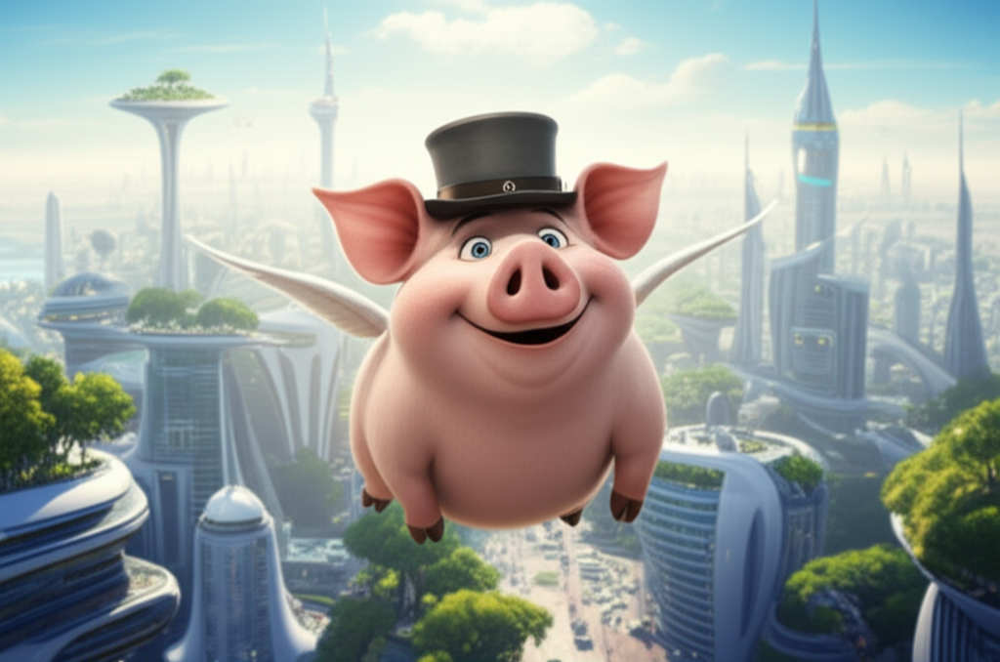

Image saved to ../assets/pig_with_wings_and_top_hat.png


In [6]:
const generate_image_response = await ai.models.generateContent({
  model: MODEL_ID,
  contents:
    "create a 3d rendered image of a pig with wings and a top hat flying over a happy futuristic scifi city with lots of greenery",
  config: {
    responseModalities: [google.Modality.TEXT, google.Modality.IMAGE],
  },
});
displayResponse(generate_image_response);
saveImage(generate_image_response, "pig_with_wings_and_top_hat.png");


## Edit images

You can also do image editing, simply pass the original image as part of the prompt.


Okay, I will transform the flying pig into a flying cat while keeping the hat, wings, and the futuristic city background consistent. The new image will feature a fluffy cat with feline features, similar wings, and the same top hat, soaring over the cityscape.


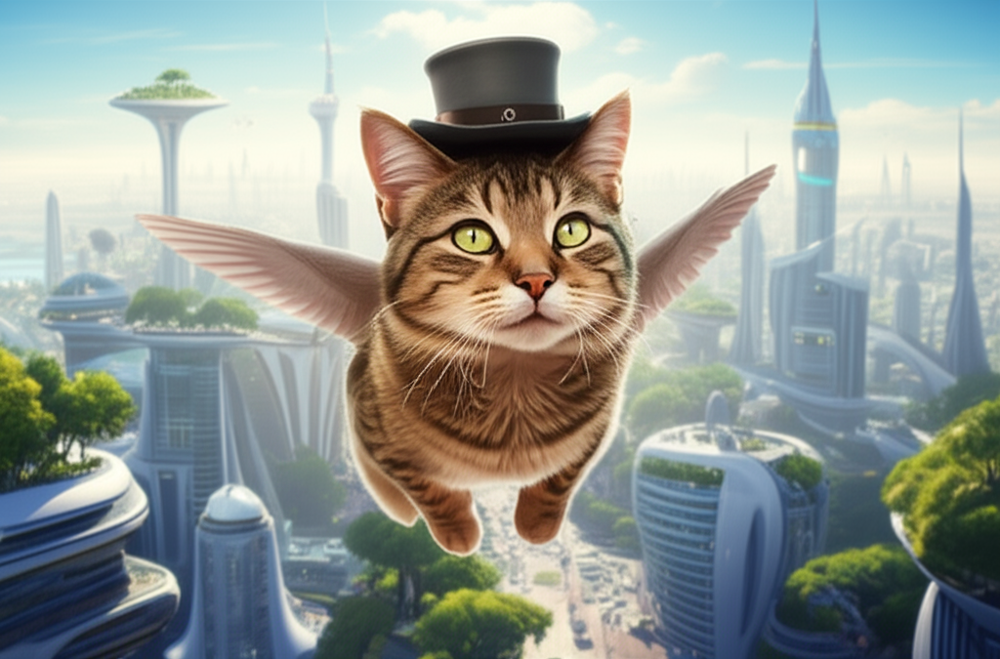

Image saved to ../assets/cat_with_wings_and_top_hat.png


In [8]:
const edit_image_response = await ai.models.generateContent({
  model: MODEL_ID,
  contents: [
    "could you edit this image to make it look like a cat instead of a pig?",
    google.createPartFromBase64(fs.readFileSync("../assets/pig_with_wings_and_top_hat.png", "base64"), "image/png"),
  ],
  config: {
    responseModalities: [google.Modality.TEXT, google.Modality.IMAGE],
  },
});
displayResponse(edit_image_response);
saveImage(edit_image_response, "cat_with_wings_and_top_hat.png");


## Get multiple images

So far you've only generated one image per call, but you can request way more than that! Let's try a baking receipe.


Okay, here are the steps to bake macarons, with an image for each step.

**Step 1: Prepare the ingredients.**

Gather your ingredients: almond flour, powdered sugar, granulated sugar, egg whites (aged), and food coloring (optional). Have your piping bag fitted with a round tip and parchment paper ready.



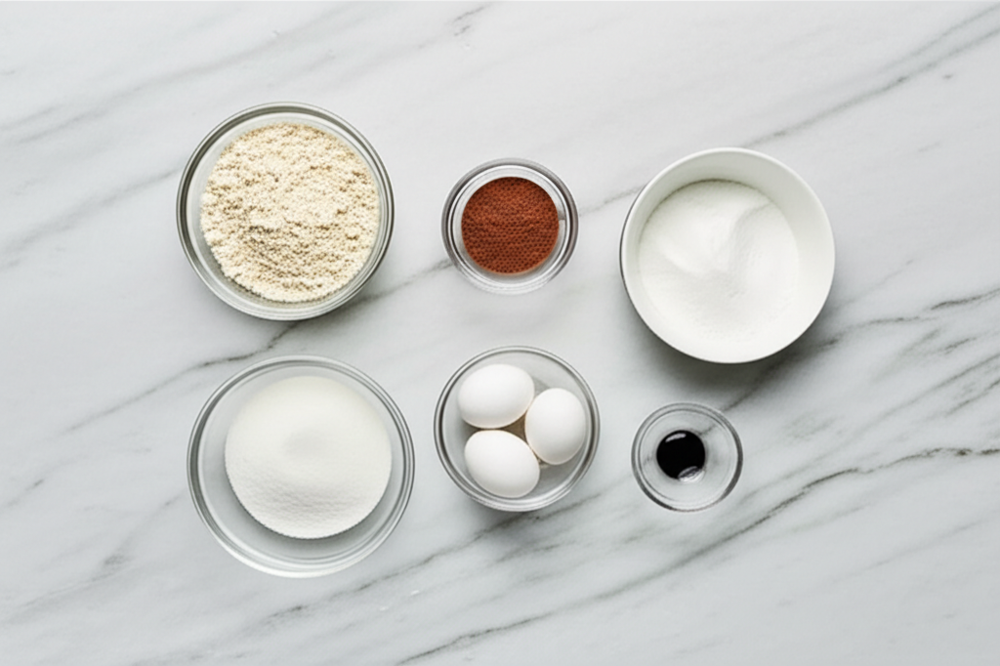



**Step 2: Sift the dry ingredients.**

Thoroughly whisk together the almond flour and powdered sugar. Then, sift the mixture through a fine-mesh sieve into a large bowl to remove any lumps. This step is crucial for smooth macaron shells.



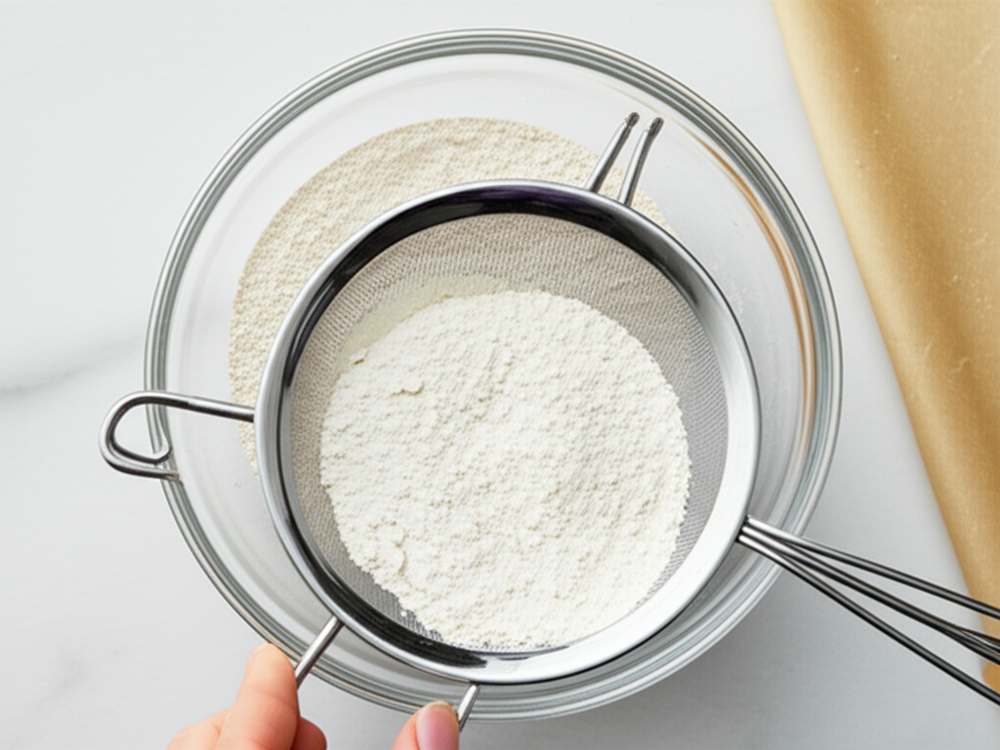



**Step 3: Make the meringue.**

In a clean, grease-free bowl of a stand mixer fitted with the whisk attachment, beat the aged egg whites on medium-low speed until foamy. Gradually add the granulated sugar while continuing to beat on medium-high speed until stiff, glossy peaks form. The meringue should hold its shape when the whisk is lifted. If using, gently fold in the food coloring at the end.



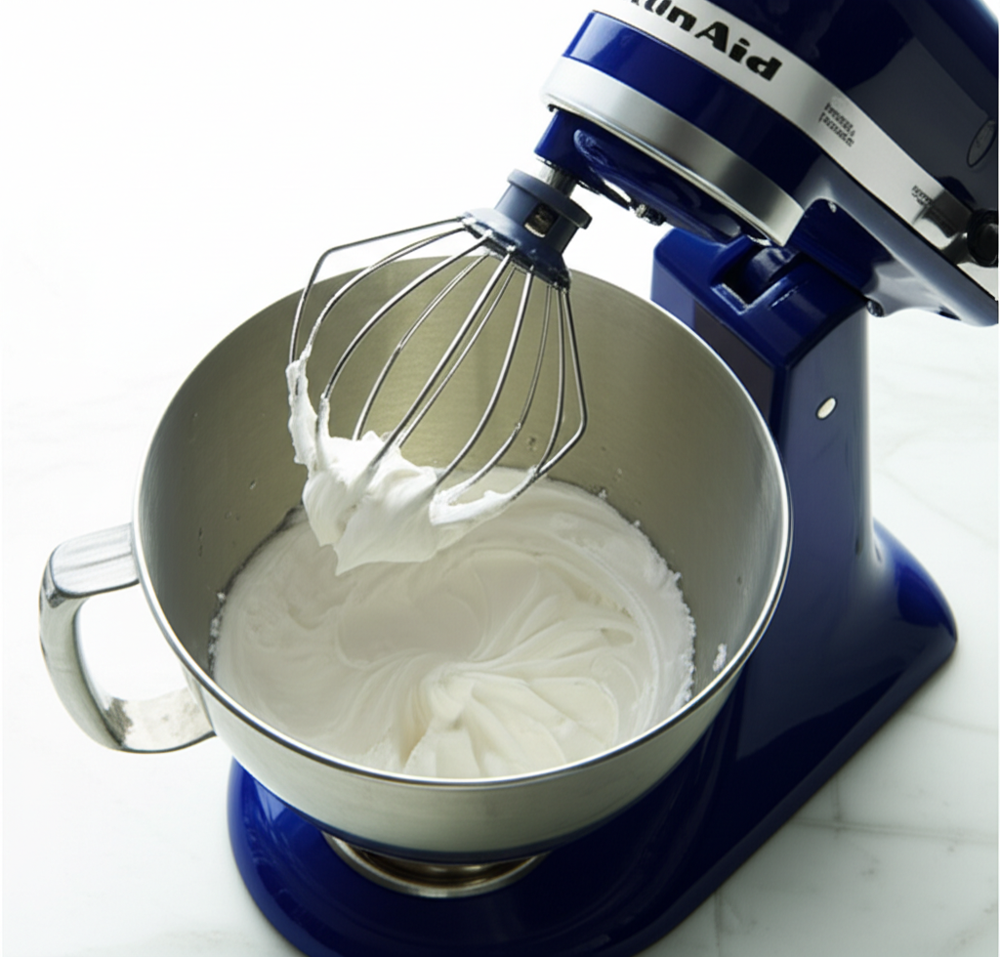



**Step 4: Macaronage.**

Pour the sifted dry ingredients into the meringue. Using a spatula, gently fold the mixture together using a circular motion, scraping down the sides of the bowl. Continue folding until the batter flows off your spatula in a thick ribbon and slowly melts back into the mixture in about 10-20 seconds. This is the macaronage stage, and it's crucial not to overmix or undermix.



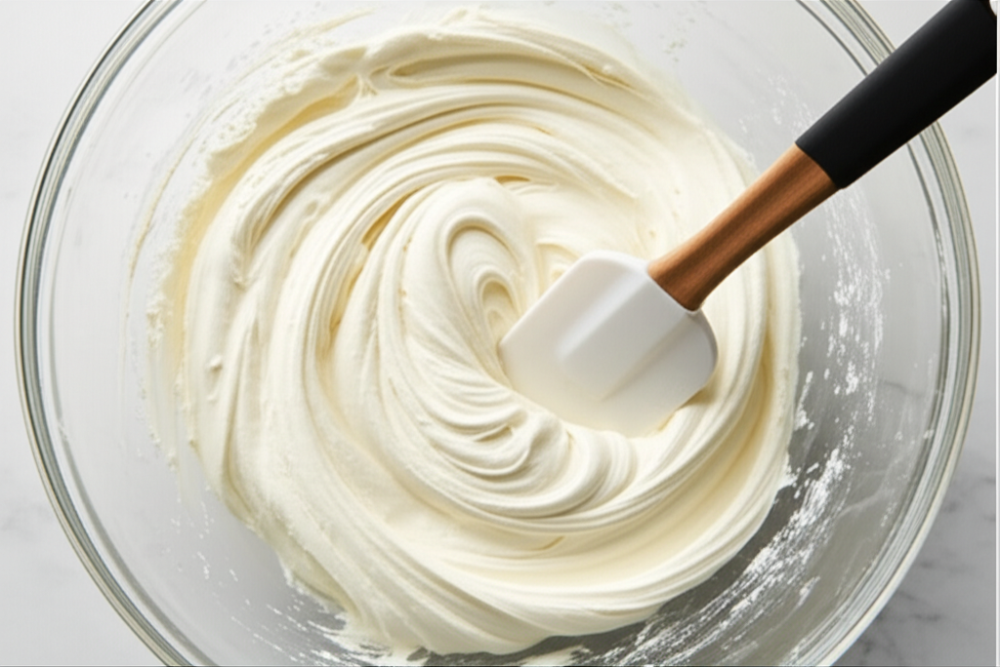



**Step 5: Pipe the macarons.**

Transfer the macaron batter into the prepared piping bag. Pipe small, even circles onto the parchment-lined baking sheets. Aim for consistent sizes, about 1.5 inches in diameter.



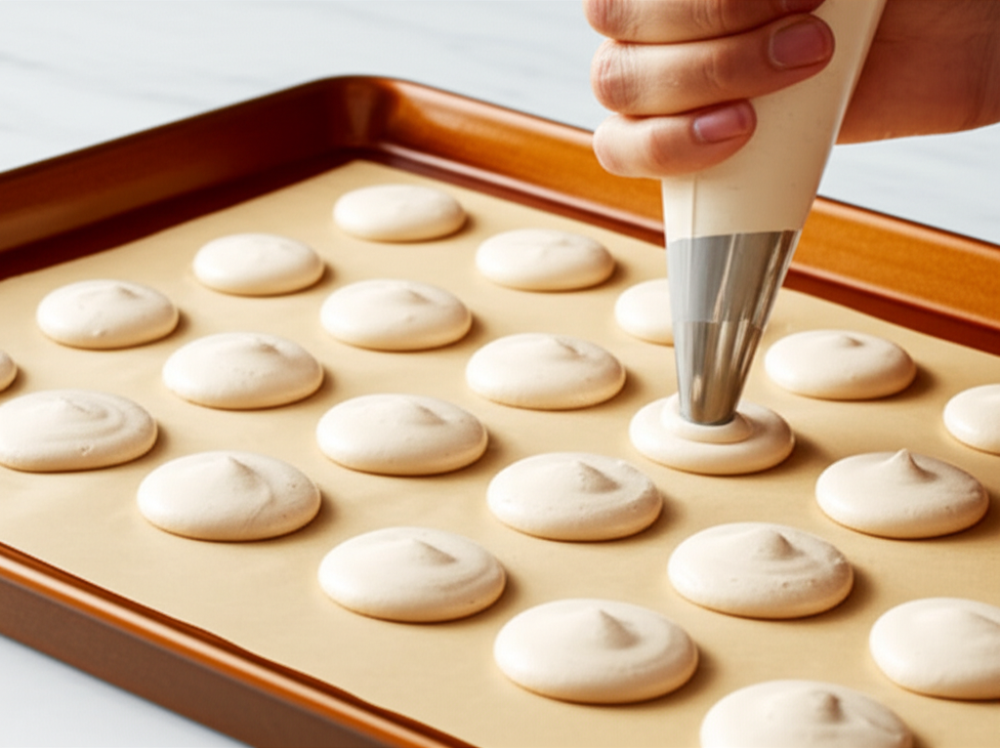



**Step 6: Tap the trays.**

Firmly tap the baking sheets several times on the counter to release any trapped air bubbles. Use a toothpick to pop any visible bubbles on the surface of the macarons.



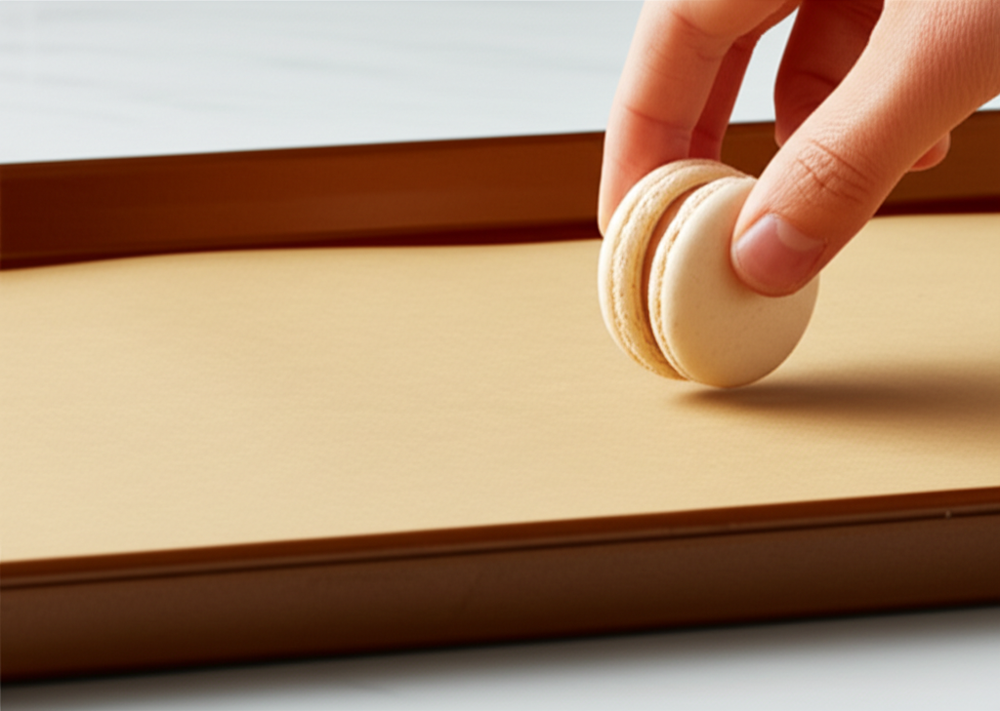



**Step 7: Rest the macarons.**

Let the piped macaron shells sit at room temperature for 30-60 minutes, or until a skin forms on the surface. You should be able to gently touch them without the batter sticking to your finger. This step is crucial for developing the "feet."



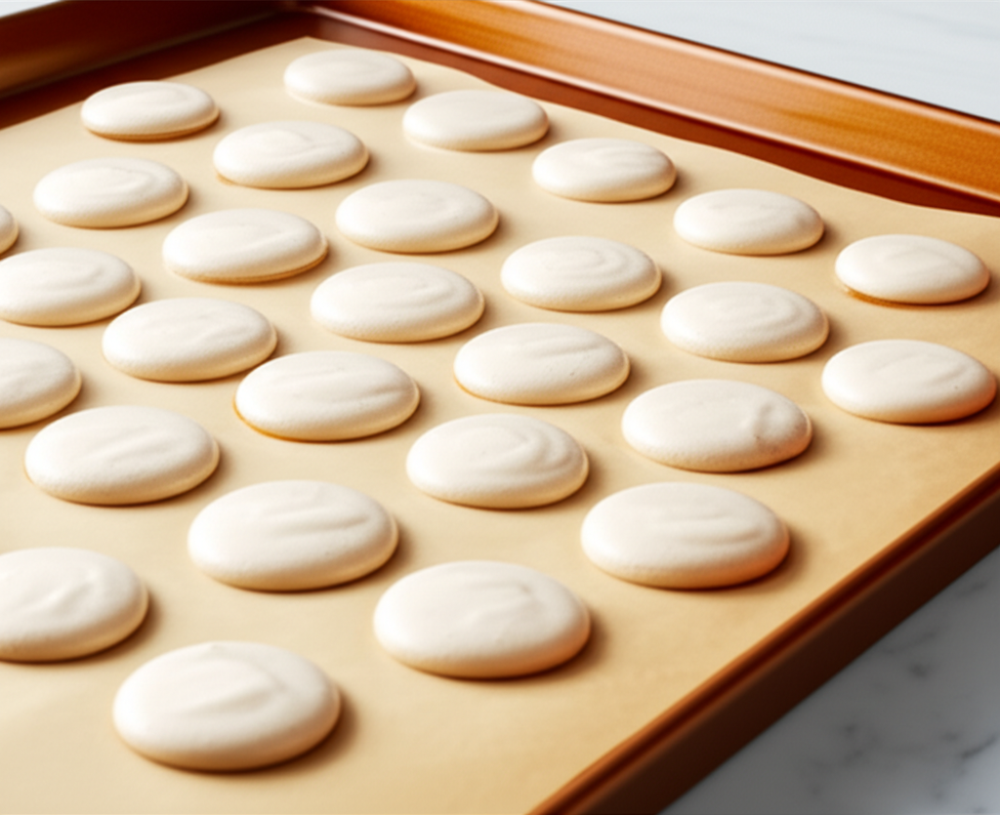



**Step 8: Bake the macarons.**

Preheat your oven to the correct temperature (usually between 285-325°F or 140-160°C, depending on your oven). Bake one tray at a time for 12-18 minutes, or until the "feet" have formed and the shells don't wiggle when gently touched.



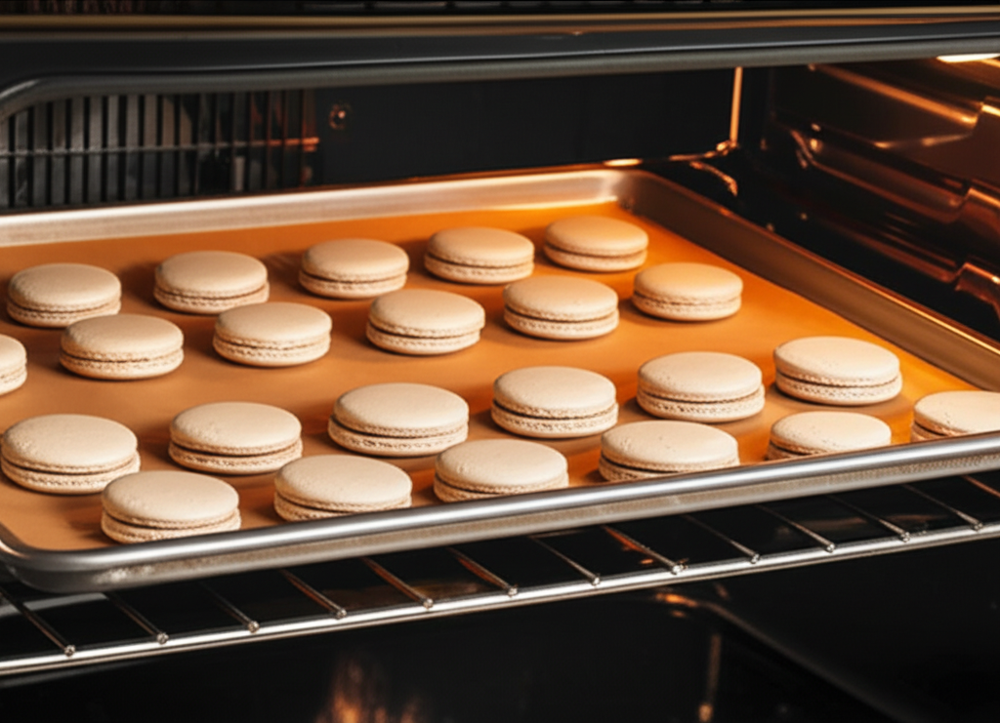



**Step 9: Cool and fill.**

Let the baked macaron shells cool completely on the baking sheets before attempting to remove them. Once cooled, match the shells by size and pipe your desired filling (like buttercream, ganache, or jam) onto the flat side of one shell. Gently sandwich it with another shell.



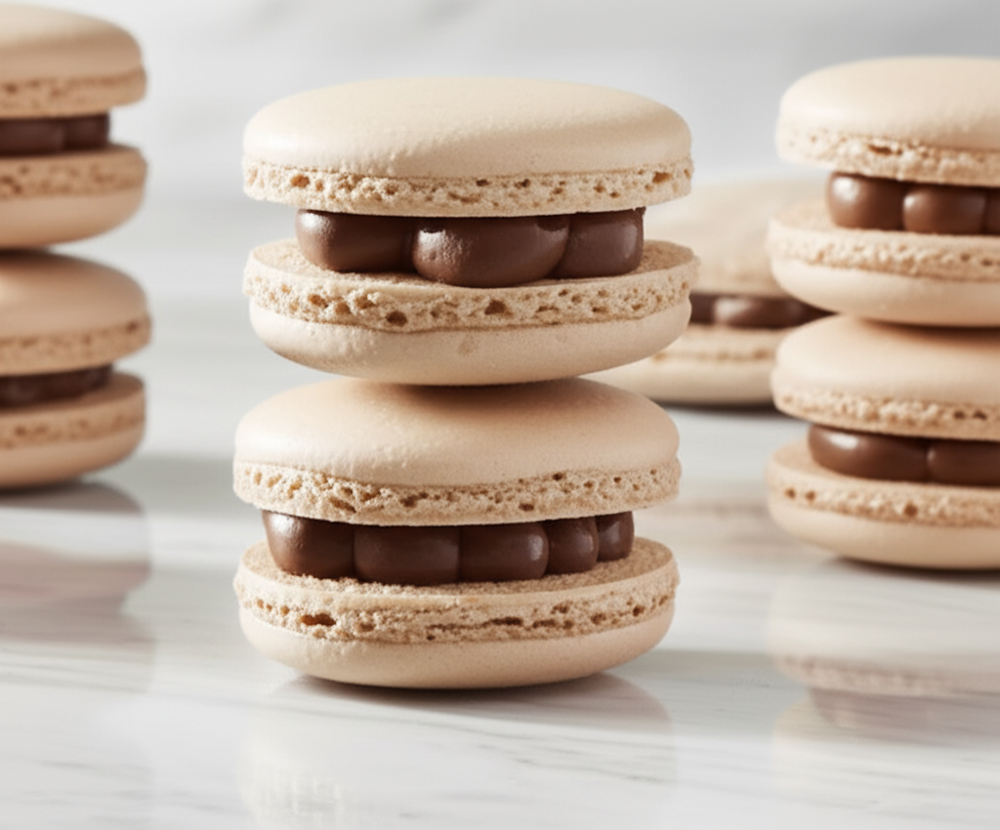



**Step 10: Mature (optional but recommended).**

For the best flavor and texture, place the filled macarons in an airtight container and refrigerate them for at least 12-24 hours. This allows the flavors to meld and the filling to soften the shells slightly.



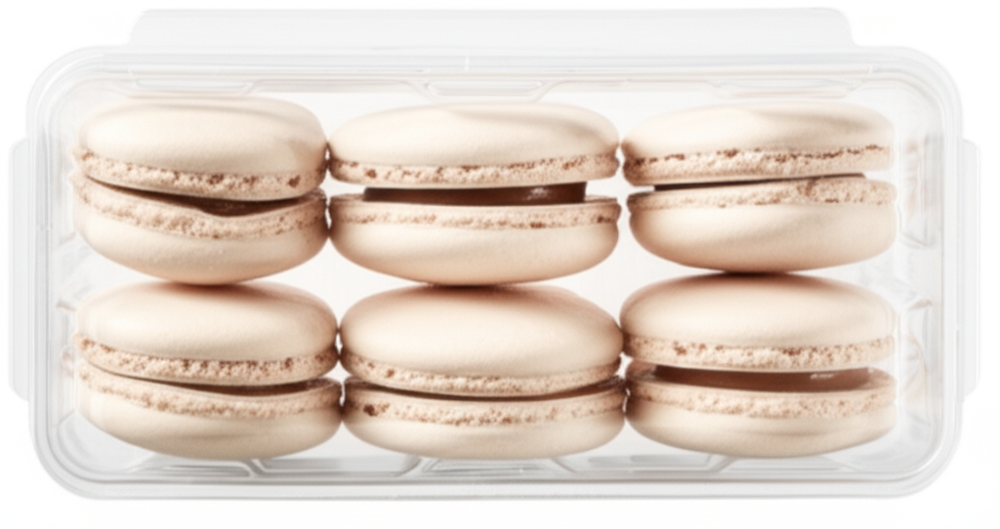



Enjoy your homemade macarons! They are delicate and can be tricky, so don't be discouraged if your first attempt isn't perfect. Practice makes perfect!

In [9]:
const multi_image_response = await ai.models.generateContent({
  model: MODEL_ID,
  contents: "Show me how to bake a macaron with images.",
  config: {
    responseModalities: [google.Modality.TEXT, google.Modality.IMAGE],
  },
});
displayResponse(multi_image_response);


## Chat (recommended)

So far you've used unary calls, but Image-out is actually made to work better with chat mode as it's easier to iterate on an image turn after turn.


In [10]:
const chat = ai.chats.create({
  model: MODEL_ID,
  config: {
    responseModalities: [google.Modality.TEXT, google.Modality.IMAGE],
  },
});


I will generate a photorealistic image of a majestic giraffe in its natural habitat, perhaps near some acacia trees, with a tiny, colorful bird with blue and red plumage resting on its head, seemingly unfazed by the height.



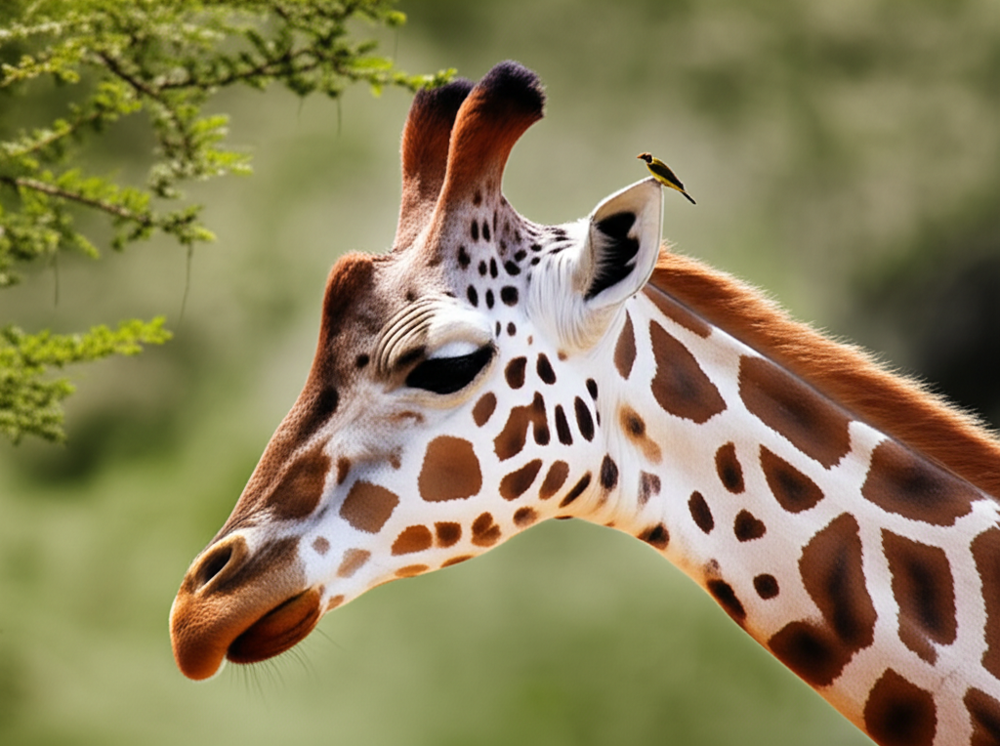

In [12]:
const chat_response_1 = await chat.sendMessage({
  message: "create a photorealistic image of a giraffe with a tiny bird on its head",
});
displayResponse(chat_response_1);


I will create a cartoon-style image of a friendly-looking giraffe with large, expressive eyes, and a small, round, blue cartoon bird cheerfully perched on its head. The style will be bright and colorful.



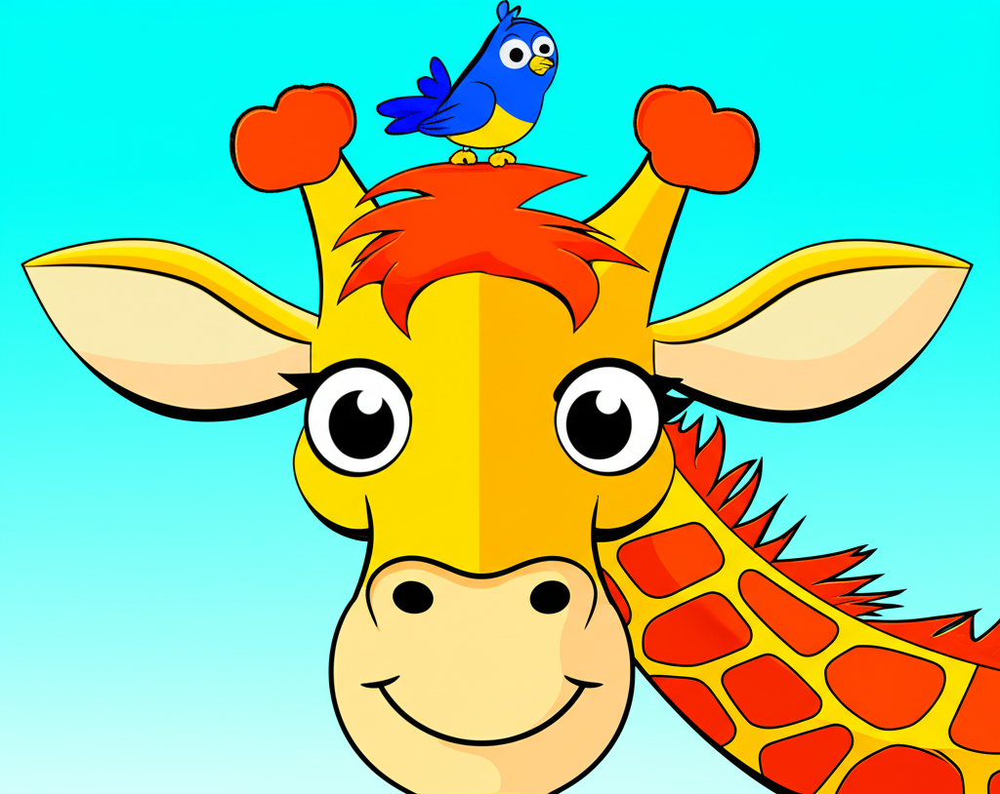

In [13]:
const chat_response_2 = await chat.sendMessage({
  message: "use a cartoon style instead of photorealistic",
});
displayResponse(chat_response_2);


I will generate a cheerful cartoon image of the same friendly giraffe with the blue bird on its head, now with a bright, curved rainbow arcing across a sunny sky in the background. Several other small, colorful cartoon birds of different shapes and sizes will be flying around the giraffe and the rainbow.



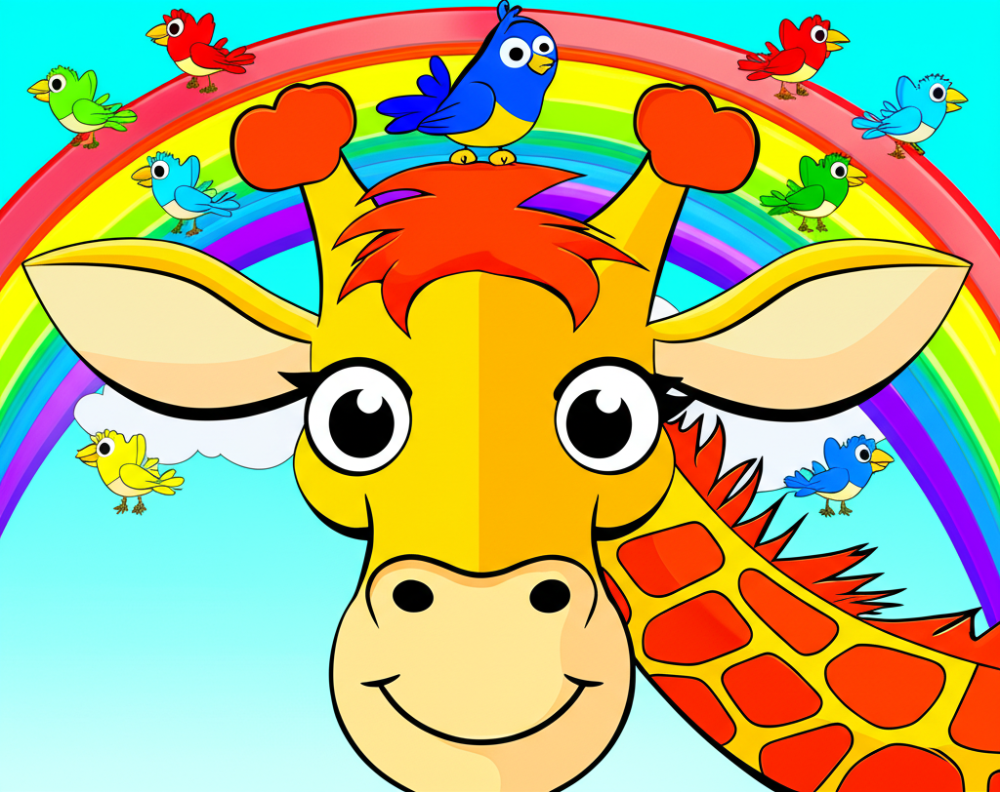

In [14]:
const chat_response_3 = await chat.sendMessage({
  message: "add a rainbow and some colorful birds",
});
displayResponse(chat_response_3);


## Next Steps

### Useful documentation references:

Check the [documentation](https://ai.google.dev/gemini-api/docs/image-generation#gemini) for more details about the image generation capabilities of the model. To improve your prompting skills, check out the [Imagen prompt guide](https://ai.google.dev/gemini-api/docs/imagen-prompt-guide) for great advices on creating your prompts.

### Check-out Imagen as well:

The [Imagen](https://ai.google.dev/gemini-api/docs/imagen-prompt-guide) model is another way to generate images. Check out the [Get Started with Imagen notebook](Get_started_imagen.ipynb) to start playing with it too.

Here are some Imagen examples to get your imagination started on how to use it in creative ways:

- [Illustrate a book](../examples/Book_illustration.ipynb): Use Gemini and Imagen to create illustration for an open-source book

### Continue your discovery of the Gemini API

Gemini is not only good at generating images, but also at understanding them. Check the [Spatial understanding](Spatial_understanding.ipynb) guide for an introduction on those capabilities, and the [Video understanding](Video_understanding.ipynb) one for video examples.
